In [31]:
import cv2
from PIL import Image
import pytesseract
from matplotlib import pyplot as plt
import numpy as np

## Opening a File

In [32]:
image_file = '../pdf_images/page_4.tiff'

img = cv2.imread(image_file)

img2 = cv2.imread('./page_3.png')

cv2.imshow('image', img)

[ WARN:0@8528.516] global loadsave.cpp:241 findDecoder imread_('./page_3.png'): can't open/read file: check file path/integrity


## Displaying Image

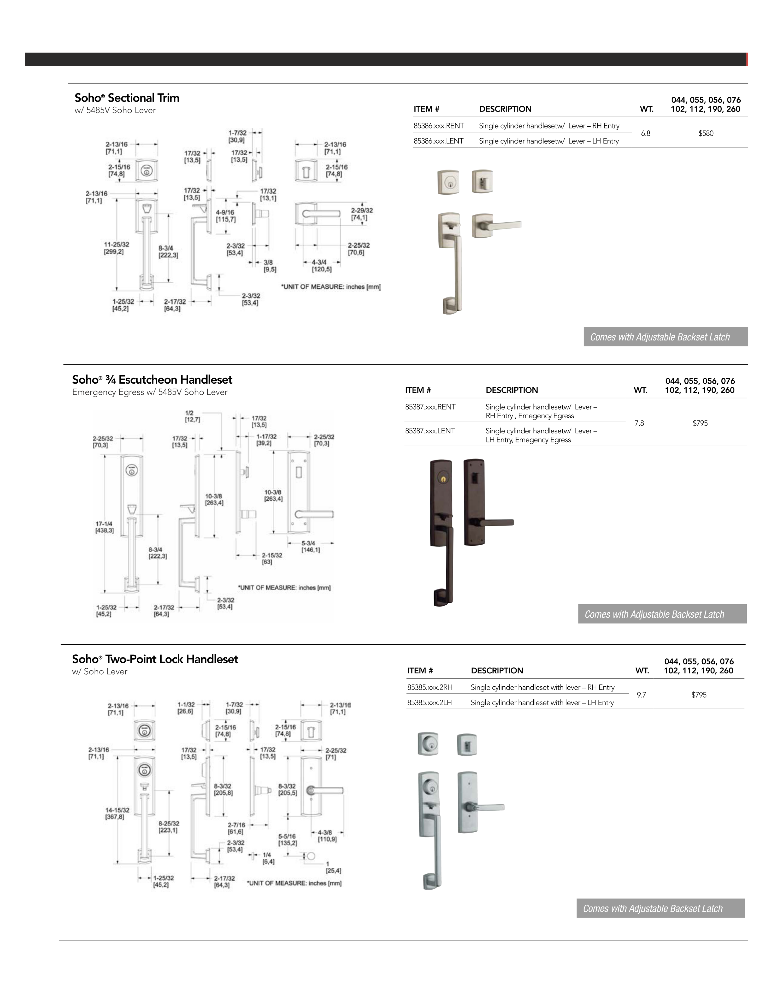

In [33]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

display(image_file)

## Inverted Image

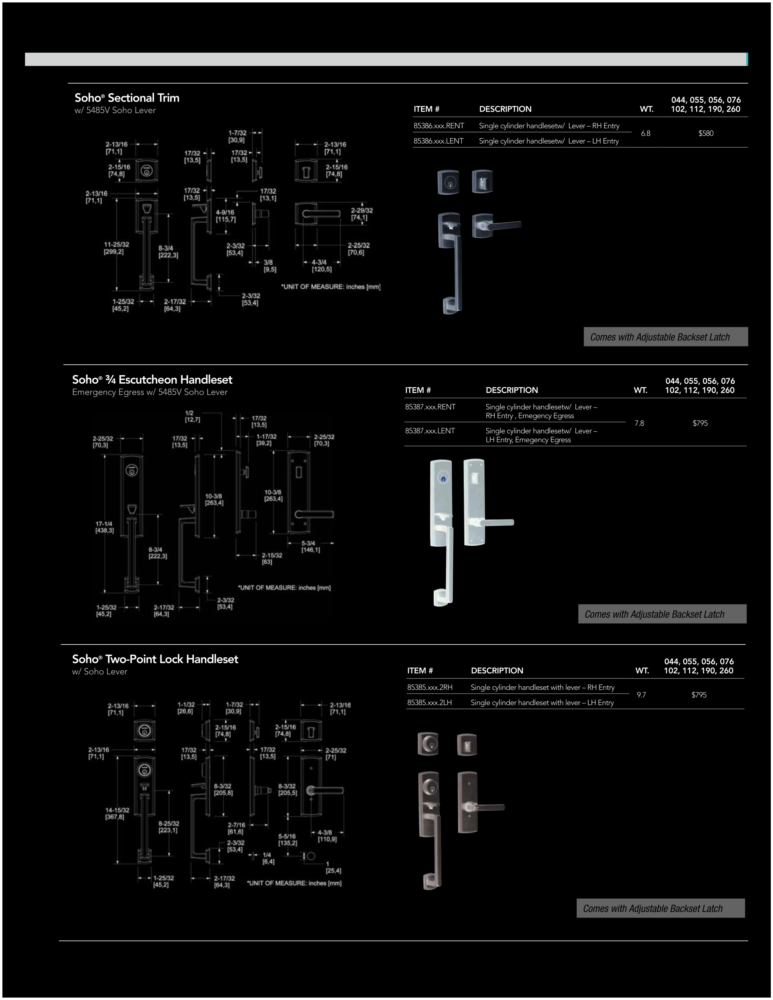

In [34]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite('../Images/inverted_image.png', inverted_image)

display('../Images/inverted_image.png')

## Binarization

In [35]:
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

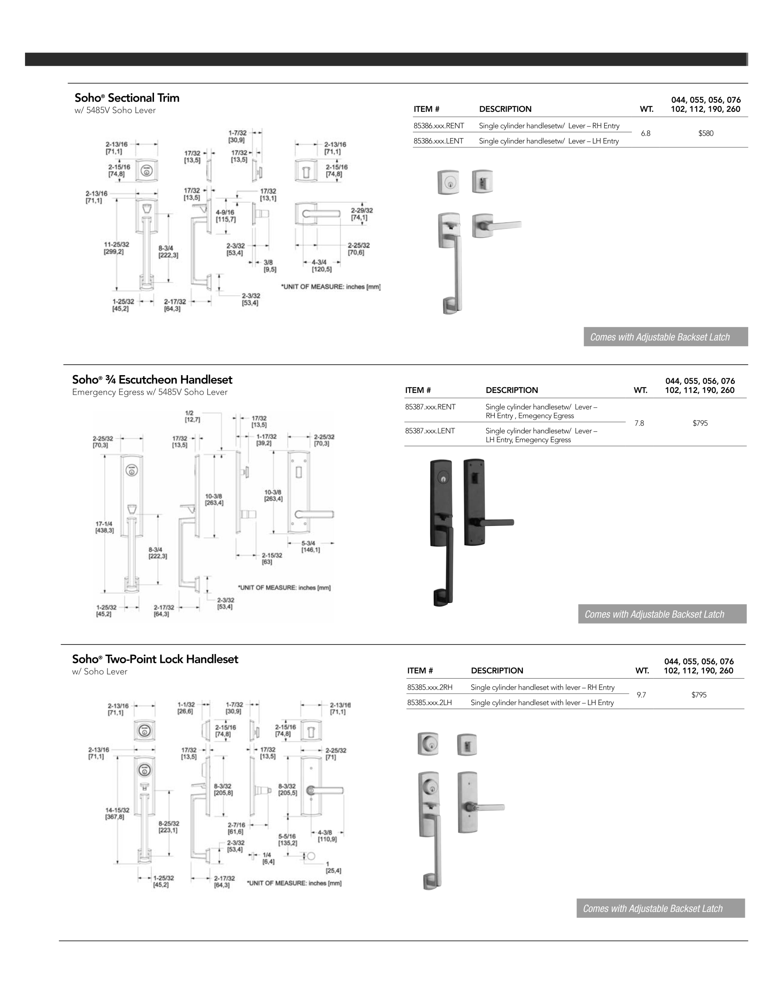

In [36]:
gray_image = grayscale(img)
cv2.imwrite('../Images/gresyscale.png', gray_image)
display('../Images/gresyscale.png')


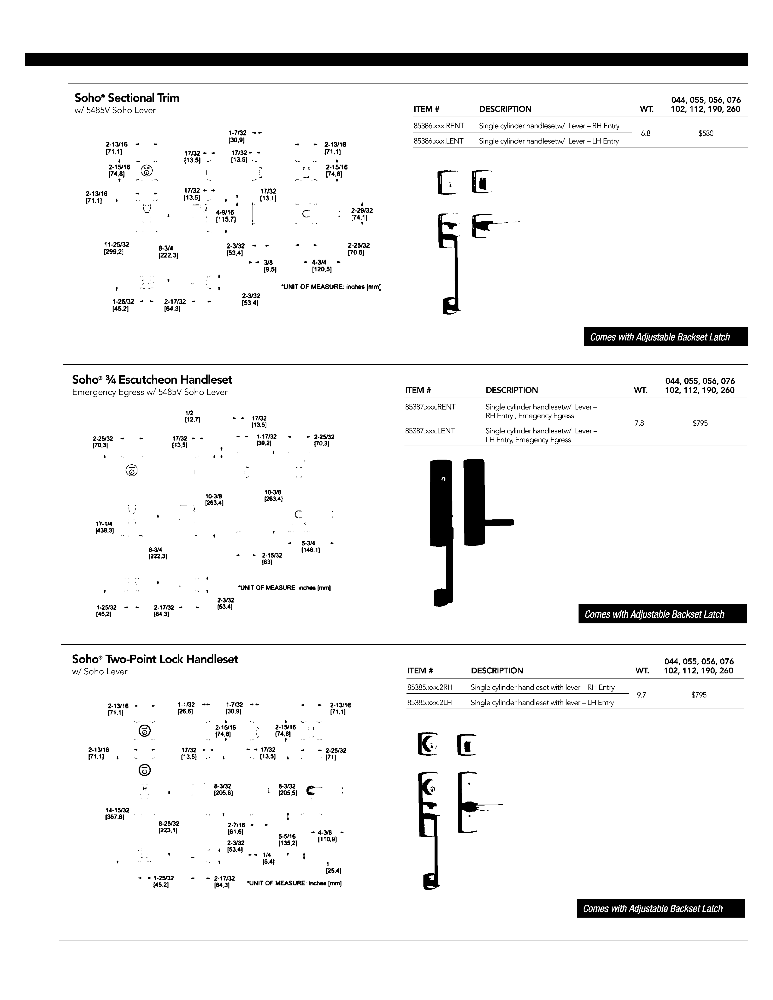

In [37]:
thresh, im_bw = cv2.threshold(gray_image, 255, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
cv2.imwrite('../Images/binary_image.png', im_bw)

display('../Images/binary_image.png')

## Noise Removal (not always necesarry)

In [38]:

def noise_removal(image):
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return image

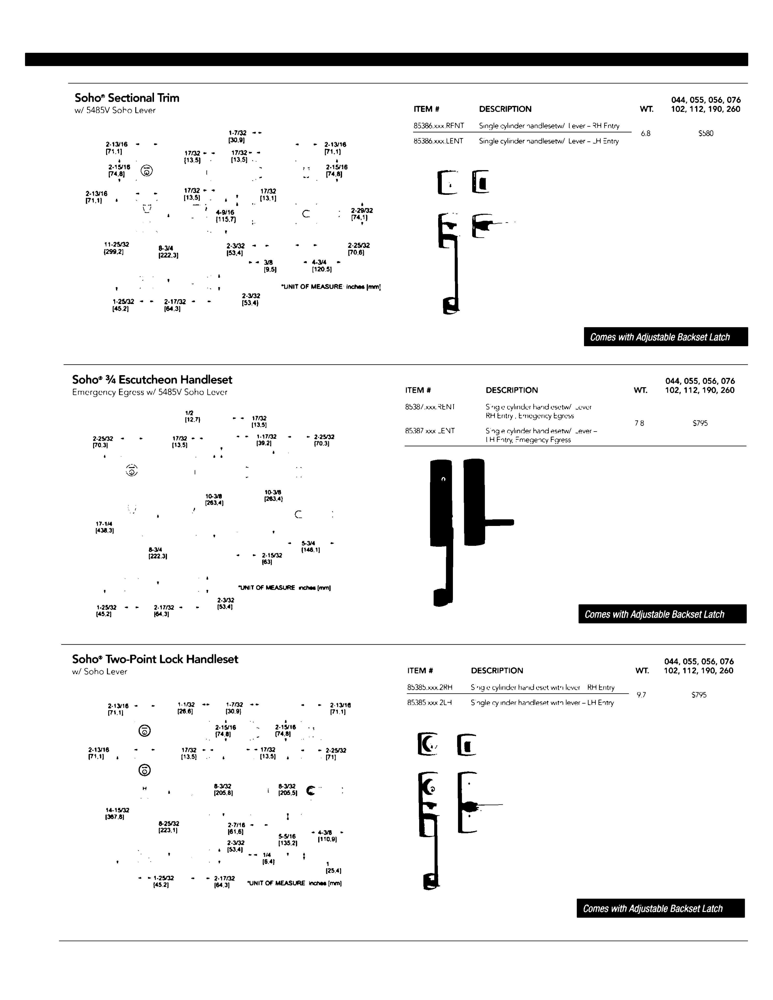

In [39]:
no_noise = noise_removal(im_bw)
cv2.imwrite('../Images/no_noise_image.png', no_noise)

display('../Images/no_noise_image.png')    

## Dilation and Erosion

In [40]:
def thin_font(image):
    image = cv2.bitwise_not(image)
    kernel = np.ones((2, 2), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image) 
    return image

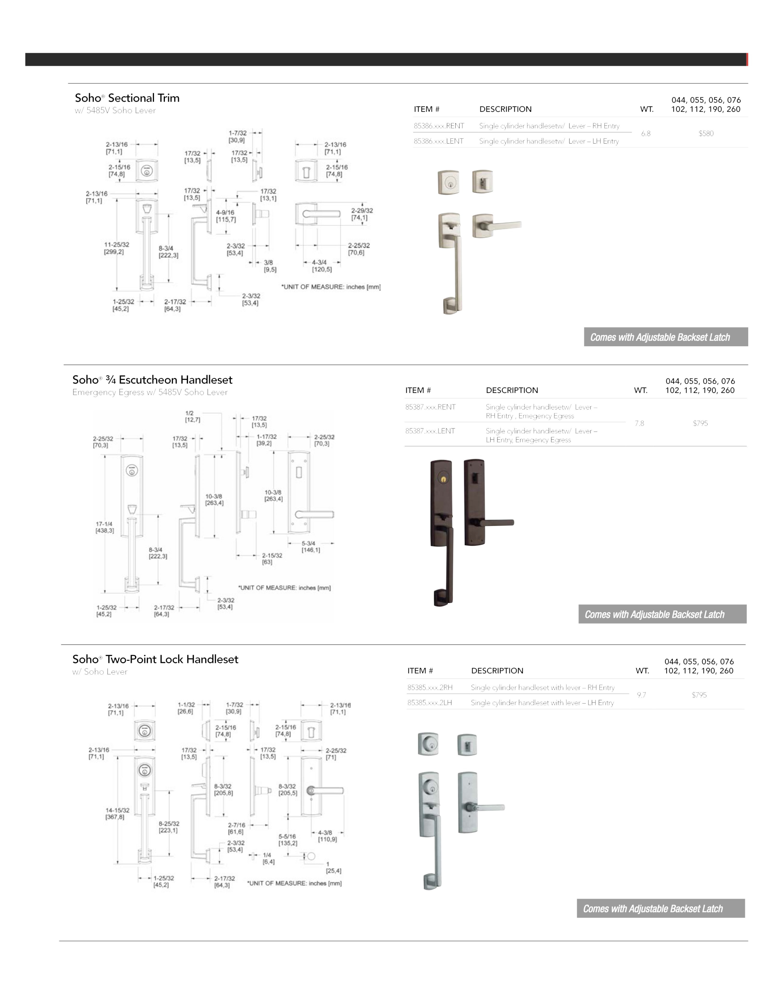

In [41]:
eroded_image = thin_font(img)
cv2.imwrite('../Images/eroded_image.png', eroded_image)

display('../Images/eroded_image.png')

In [42]:
def thick_font(image):
    image = cv2.bitwise_not(image)
    kernel = np.ones((2, 2), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image) 
    return image

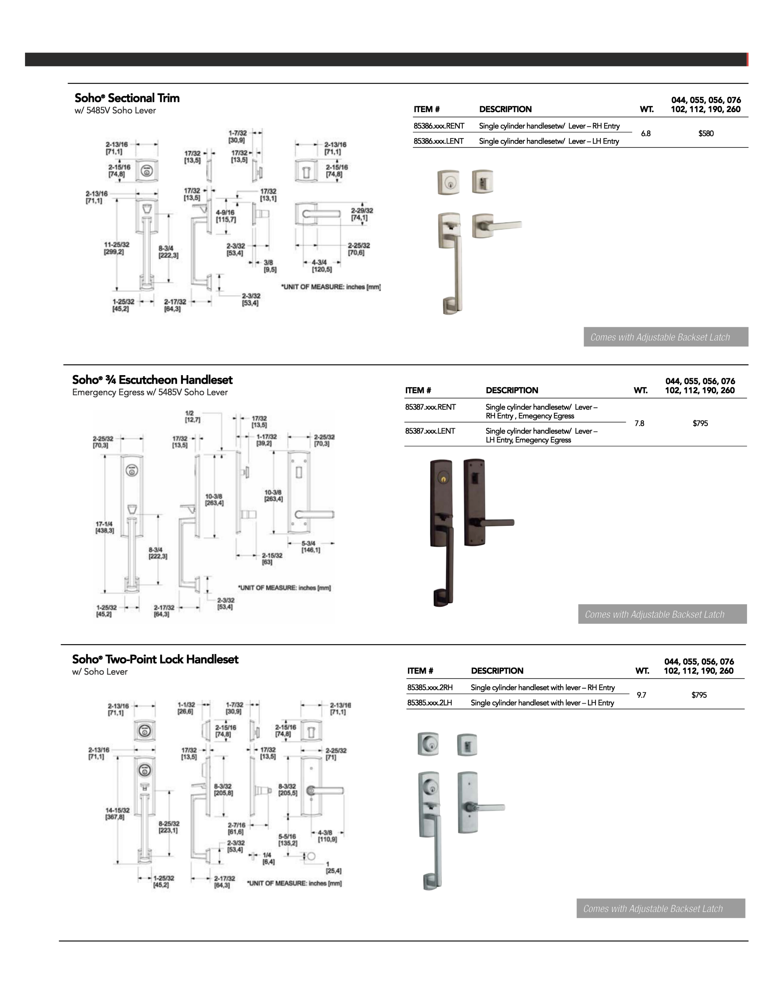

In [43]:
dilated_image = thick_font(img)
# dilated_image_2 = thick_font(img2)

cv2.imwrite('../Images/dilated_image.TIFF', dilated_image)

display('../Images/dilated_image.TIFF')

## Make Borders

In [44]:
color = (0, 0, 0)
top, bottom, left, right = [50]*4

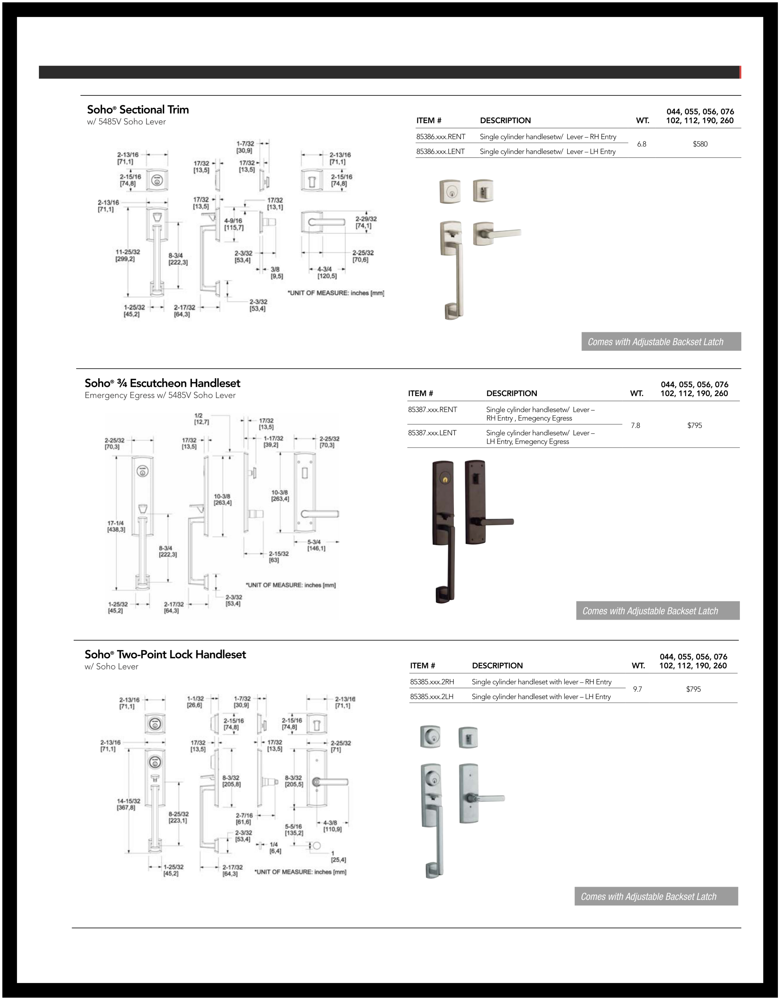

In [45]:
image_with_border = cv2.copyMakeBorder(img, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)

cv2.imwrite('../Images/image_with_border.png', image_with_border)


display('../Images/image_with_border.png')

## Basic OCR with Preprocessed Image

In [46]:
img_file_tiff = '../Images/dilated_image.TIFF'
img_file_png = '../Images/dilated_image.png'
img_file_jpg = '../Images/dilated_image.jpg'
img_file_tiff_2 = '../Images/dilated_image_2.TIFF'

In [47]:
img = Image.open(img_file_tiff)

ocr_result = pytesseract.image_to_string(img)

# img = Image.open(img_file_tiff_2)

# ocr_result_2 = pytesseract.image_to_string(img)

with open('../results/ocr_result_page7.txt', 'w') as file:
    file.write(ocr_result)

# with open('ocr_result_page3.txt', 'w') as file:
#     file.write(ocr_result_2)

print(ocr_result)

TesseractError: (-6, "dyld[58624]: Library not loaded: @rpath/libarchive.19.dylib   Referenced from: <7E8B66FC-8E64-39A8-8FA6-124F96B350DF> /opt/anaconda3/envs/catalog/bin/tesseract   Reason: tried: '/opt/anaconda3/envs/catalog/bin/../lib/libarchive.19.dylib' (no such file), '/opt/anaconda3/envs/catalog/bin/../lib/libarchive.19.dylib' (no such file), '/usr/local/lib/libarchive.19.dylib' (no such file), '/usr/lib/libarchive.19.dylib' (no such file, not in dyld cache)")

## Boundary Boxes + Preprocessing Image

In [71]:
image = cv2.imread('../misc/page_7.png')

page_str = 'page_7'

def thick_font(image):
    image = cv2.bitwise_not(image)
    kernel = np.ones((2, 2), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image) 
    return image

image = thick_font(image)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

cv2.imwrite(f'../boxes/{page_str}_gray.png', gray)

True

## Blur to help identify structure of page

In [72]:
blur = cv2.GaussianBlur(gray, (11, 11), 0)

cv2.imwrite(f'../boxes/{page_str}_blur.png', blur)

True

## Edge Detection

In [73]:
edges = cv2.Canny(blur, 50, 150)
cv2.imwrite(f'../boxes/{page_str}_edges.png', edges)

True

## Threshold 

In [74]:
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

cv2.imwrite(f'../boxes/{page_str}_thresh.png', thresh)

True

## Kernel (determine structure)

In [75]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (130, 10))

cv2.imwrite(f'../boxes/{page_str}_kernel.png', kernel)

True

## Dilate


In [76]:
dilate = cv2.dilate(edges, kernel, iterations=3)
cv2.imwrite(f'../boxes/{page_str}_dilate.png', dilate)

True

## Create contours/boundary boxes

In [77]:
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

cnts = cnts[0] if len(cnts) == 2 else cnts[1]

## Performing OCR on Boundary Boxes

In [78]:
cnts = sorted(cnts, key=lambda x: cv2.boundingRect(x)[1])

index = 0

for c in cnts:
    x, y, w, h = cv2.boundingRect(c)
    if w > 500 and h > 250:
        roi = image[y:y+h, x:x+w]
        print('Shape', roi.shape)
        print('Size', roi.size)
        
        cv2.rectangle(image, (x, y), (x + w, y + h), (36, 255, 12), 2)
        # ocr_result = pytesseract.image_to_string(roi)
        
        # ocr_filename = f'../results/ocr_box_{page_str}_{index}.txt'

        # with open(ocr_filename, 'w') as file:
        #     file.write(ocr_result + "\n\n\n")
            
        index+=1
        
cv2.imwrite(f'../boxes/{page_str}_boxes.png', image)

Shape (505, 2533, 3)
Size 3837495
Shape (489, 2509, 3)
Size 3680703
Shape (487, 2518, 3)
Size 3678798
Shape (486, 2513, 3)
Size 3663954
Shape (535, 2545, 3)
Size 4084725


True